In [14]:
import pandas as pd 
import datetime , calendar
import folium

In [15]:
data = pd.read_csv("dataset.csv")
data.head()

,TRIP_ID,CALL_TYPE,TIMESTAMP,TRIP_PATH
0,1372636858620000589,C,1372636858,"[(41.141412, -8.618643), (41.141376, -8.618499..."
1,1372637303620000596,B,1372637303,"[(41.159826, -8.639847), (41.159871, -8.640351..."
2,1372636951620000320,C,1372636951,"[(41.140359, -8.612964), (41.14035, -8.613378)..."
3,1372636854620000520,C,1372636854,"[(41.151951, -8.574678), (41.151942, -8.574705..."
4,1372637091620000337,C,1372637091,"[(41.18049, -8.645994), (41.180517, -8.645949)..."


'A' : if this trip was dispatched from the central
'B' : if this trip was demanded directly to a taxi driver on a specific stand
'C' : other (i.e. a trip demanded on a random street)

In [16]:
eval(data.TRIP_PATH.iloc[0])[0]

(41.141412, -8.618643)

In [17]:
data.TRIP_PATH = data.TRIP_PATH.apply(eval)
data.head()

,TRIP_ID,CALL_TYPE,TIMESTAMP,TRIP_PATH
0,1372636858620000589,C,1372636858,"[(41.141412, -8.618643), (41.141376, -8.618499..."
1,1372637303620000596,B,1372637303,"[(41.159826, -8.639847), (41.159871, -8.640351..."
2,1372636951620000320,C,1372636951,"[(41.140359, -8.612964), (41.14035, -8.613378)..."
3,1372636854620000520,C,1372636854,"[(41.151951, -8.574678), (41.151942, -8.574705..."
4,1372637091620000337,C,1372637091,"[(41.18049, -8.645994), (41.180517, -8.645949)..."


In [18]:
extract_starting_point=lambda list_ : list_[0]
extract_ending_point = lambda list_ : list_[-1]
data["START_LOC"]= data.TRIP_PATH.apply(extract_starting_point)
data["END_LOC"]= data.TRIP_PATH.apply(extract_ending_point)

data.head()

,TRIP_ID,CALL_TYPE,TIMESTAMP,TRIP_PATH,START_LOC,END_LOC
0,1372636858620000589,C,1372636858,"[(41.141412, -8.618643), (41.141376, -8.618499...","(41.141412, -8.618643)","(41.154489, -8.630838)"
1,1372637303620000596,B,1372637303,"[(41.159826, -8.639847), (41.159871, -8.640351...","(41.159826, -8.639847)","(41.170671, -8.66574)"
2,1372636951620000320,C,1372636951,"[(41.140359, -8.612964), (41.14035, -8.613378)...","(41.140359, -8.612964)","(41.14053, -8.61597)"
3,1372636854620000520,C,1372636854,"[(41.151951, -8.574678), (41.151942, -8.574705...","(41.151951, -8.574678)","(41.142915, -8.607996)"
4,1372637091620000337,C,1372637091,"[(41.18049, -8.645994), (41.180517, -8.645949)...","(41.18049, -8.645994)","(41.178087, -8.687268)"


In [19]:
CALL_TYPES = {
              "A":"CENTRAL_BASED",
              "B":"STAND_BASED",
              "C":"OTHER"
             }

data.CALL_TYPE = data.CALL_TYPE.map(CALL_TYPES)
data.head()

,TRIP_ID,CALL_TYPE,TIMESTAMP,TRIP_PATH,START_LOC,END_LOC
0,1372636858620000589,OTHER,1372636858,"[(41.141412, -8.618643), (41.141376, -8.618499...","(41.141412, -8.618643)","(41.154489, -8.630838)"
1,1372637303620000596,STAND_BASED,1372637303,"[(41.159826, -8.639847), (41.159871, -8.640351...","(41.159826, -8.639847)","(41.170671, -8.66574)"
2,1372636951620000320,OTHER,1372636951,"[(41.140359, -8.612964), (41.14035, -8.613378)...","(41.140359, -8.612964)","(41.14053, -8.61597)"
3,1372636854620000520,OTHER,1372636854,"[(41.151951, -8.574678), (41.151942, -8.574705...","(41.151951, -8.574678)","(41.142915, -8.607996)"
4,1372637091620000337,OTHER,1372637091,"[(41.18049, -8.645994), (41.180517, -8.645949)...","(41.18049, -8.645994)","(41.178087, -8.687268)"


Wich one is more common?

<Axes: xlabel='CALL_TYPE'>

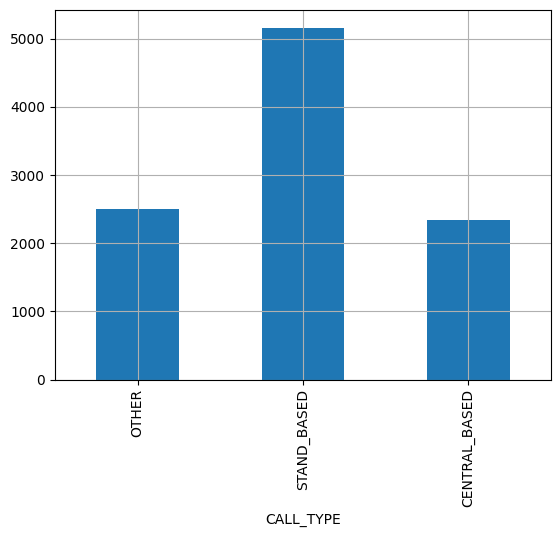

In [23]:
q1_data = data.CALL_TYPE.value_counts(sort=False)
q1_data.plot.bar(grid=True)

where you pick up by the taxi more easily? (Dotmap)

In [25]:
data.head()

,TRIP_ID,CALL_TYPE,TIMESTAMP,TRIP_PATH,START_LOC,END_LOC
0,1372636858620000589,OTHER,1372636858,"[(41.141412, -8.618643), (41.141376, -8.618499...","(41.141412, -8.618643)","(41.154489, -8.630838)"
1,1372637303620000596,STAND_BASED,1372637303,"[(41.159826, -8.639847), (41.159871, -8.640351...","(41.159826, -8.639847)","(41.170671, -8.66574)"
2,1372636951620000320,OTHER,1372636951,"[(41.140359, -8.612964), (41.14035, -8.613378)...","(41.140359, -8.612964)","(41.14053, -8.61597)"
3,1372636854620000520,OTHER,1372636854,"[(41.151951, -8.574678), (41.151942, -8.574705...","(41.151951, -8.574678)","(41.142915, -8.607996)"
4,1372637091620000337,OTHER,1372637091,"[(41.18049, -8.645994), (41.180517, -8.645949)...","(41.18049, -8.645994)","(41.178087, -8.687268)"


In [34]:
Map = folium.Map(location = [41.15,-8.62], zoom_start= 14)
for point in data.START_LOC:
    folium.CircleMarker(location= point , color = "red" , radius = 1 , weight = 2).add_to(Map)
Map

define best locations for diffrent kind of trips

In [35]:
data.head()

,TRIP_ID,CALL_TYPE,TIMESTAMP,TRIP_PATH,START_LOC,END_LOC
0,1372636858620000589,OTHER,1372636858,"[(41.141412, -8.618643), (41.141376, -8.618499...","(41.141412, -8.618643)","(41.154489, -8.630838)"
1,1372637303620000596,STAND_BASED,1372637303,"[(41.159826, -8.639847), (41.159871, -8.640351...","(41.159826, -8.639847)","(41.170671, -8.66574)"
2,1372636951620000320,OTHER,1372636951,"[(41.140359, -8.612964), (41.14035, -8.613378)...","(41.140359, -8.612964)","(41.14053, -8.61597)"
3,1372636854620000520,OTHER,1372636854,"[(41.151951, -8.574678), (41.151942, -8.574705...","(41.151951, -8.574678)","(41.142915, -8.607996)"
4,1372637091620000337,OTHER,1372637091,"[(41.18049, -8.645994), (41.180517, -8.645949)...","(41.18049, -8.645994)","(41.178087, -8.687268)"


In [42]:
NMAP = folium.Map(location = [41.15,-8.62] , zoom_start = 14)

colors = {
    "OTHER" : "purple",
    "STAND_BASED" : "red",
    "CENTRAL_BASED" : "green"
}

Ndata = data[["CALL_TYPE","START_LOC"]]
for index, row in Ndata.iterrows():
    color = colors[row["CALL_TYPE"]]
    location = row["START_LOC"]
    folium.CircleMarker(location, color = color , radius = 1, weight = 2).add_to(NMAP)
NMAP

    



define best locations for diffrent kind of trips by considering time (a specific day)

In [50]:
day_names = list(calendar.day_name)

In [51]:
get_day = lambda timestamp : day_names[datetime.datetime.fromtimestamp(timestamp).weekday()]
data["week_day"] = data.TIMESTAMP.apply(get_day)
data.head()

,TRIP_ID,CALL_TYPE,TIMESTAMP,TRIP_PATH,START_LOC,END_LOC,week_day
0,1372636858620000589,OTHER,1372636858,"[(41.141412, -8.618643), (41.141376, -8.618499...","(41.141412, -8.618643)","(41.154489, -8.630838)",Monday
1,1372637303620000596,STAND_BASED,1372637303,"[(41.159826, -8.639847), (41.159871, -8.640351...","(41.159826, -8.639847)","(41.170671, -8.66574)",Monday
2,1372636951620000320,OTHER,1372636951,"[(41.140359, -8.612964), (41.14035, -8.613378)...","(41.140359, -8.612964)","(41.14053, -8.61597)",Monday
3,1372636854620000520,OTHER,1372636854,"[(41.151951, -8.574678), (41.151942, -8.574705...","(41.151951, -8.574678)","(41.142915, -8.607996)",Monday
4,1372637091620000337,OTHER,1372637091,"[(41.18049, -8.645994), (41.180517, -8.645949)...","(41.18049, -8.645994)","(41.178087, -8.687268)",Monday


In [53]:
daydata=data[data.week_day == "Monday"]
daydata.head()

,TRIP_ID,CALL_TYPE,TIMESTAMP,TRIP_PATH,START_LOC,END_LOC,week_day
0,1372636858620000589,OTHER,1372636858,"[(41.141412, -8.618643), (41.141376, -8.618499...","(41.141412, -8.618643)","(41.154489, -8.630838)",Monday
1,1372637303620000596,STAND_BASED,1372637303,"[(41.159826, -8.639847), (41.159871, -8.640351...","(41.159826, -8.639847)","(41.170671, -8.66574)",Monday
2,1372636951620000320,OTHER,1372636951,"[(41.140359, -8.612964), (41.14035, -8.613378)...","(41.140359, -8.612964)","(41.14053, -8.61597)",Monday
3,1372636854620000520,OTHER,1372636854,"[(41.151951, -8.574678), (41.151942, -8.574705...","(41.151951, -8.574678)","(41.142915, -8.607996)",Monday
4,1372637091620000337,OTHER,1372637091,"[(41.18049, -8.645994), (41.180517, -8.645949)...","(41.18049, -8.645994)","(41.178087, -8.687268)",Monday


In [55]:
daymap = folium.Map(location = [41.15,-8.62] , zoom_start = 14)
for loc in daydata.END_LOC:
    folium.CircleMarker(loc, color = "green" , radius = 1 , weight = 2).add_to(daymap)
daymap

define best locations for diffrent kind of trips by considering time (a specific hour)

In [56]:
get_hour = lambda timestamp : datetime.datetime.fromtimestamp(timestamp).hour
data["hour"]=data.TIMESTAMP.apply(get_hour)
data.head()

,TRIP_ID,CALL_TYPE,TIMESTAMP,TRIP_PATH,START_LOC,END_LOC,week_day,hour
0,1372636858620000589,OTHER,1372636858,"[(41.141412, -8.618643), (41.141376, -8.618499...","(41.141412, -8.618643)","(41.154489, -8.630838)",Monday,3
1,1372637303620000596,STAND_BASED,1372637303,"[(41.159826, -8.639847), (41.159871, -8.640351...","(41.159826, -8.639847)","(41.170671, -8.66574)",Monday,3
2,1372636951620000320,OTHER,1372636951,"[(41.140359, -8.612964), (41.14035, -8.613378)...","(41.140359, -8.612964)","(41.14053, -8.61597)",Monday,3
3,1372636854620000520,OTHER,1372636854,"[(41.151951, -8.574678), (41.151942, -8.574705...","(41.151951, -8.574678)","(41.142915, -8.607996)",Monday,3
4,1372637091620000337,OTHER,1372637091,"[(41.18049, -8.645994), (41.180517, -8.645949)...","(41.18049, -8.645994)","(41.178087, -8.687268)",Monday,3


In [58]:
hdata=data[(data.week_day=="Monday")&(data.hour>6)&(data.hour<9)]
hdata

,TRIP_ID,CALL_TYPE,TIMESTAMP,TRIP_PATH,START_LOC,END_LOC,week_day,hour
178,1372650050620000534,OTHER,1372650050,"[(41.152635, -8.631927), (41.152491, -8.628588...","(41.152635, -8.631927)","(41.147217, -8.612244)",Monday,7
179,1372649562620000686,STAND_BASED,1372649562,"[(41.145939, -8.612703), (41.145993, -8.612577...","(41.145939, -8.612703)","(41.160852, -8.637705)",Monday,7
188,1372650711620000403,OTHER,1372650711,"[(41.147271, -8.615736), (41.147289, -8.615772...","(41.147271, -8.615736)","(41.147298, -8.615808)",Monday,7
189,1372650516620000307,STAND_BASED,1372650516,"[(41.166936, -8.626923), (41.166945, -8.626914...","(41.166936, -8.626923)","(41.167944, -8.629515)",Monday,7
190,1372650895620000403,OTHER,1372650895,"[(41.147298, -8.615817)]","(41.147298, -8.615817)","(41.147298, -8.615817)",Monday,7
...,...,...,...,...,...,...,...,...
1176,1372651042620000171,CENTRAL_BASED,1372651042,"[(41.159934, -8.611686), (41.159934, -8.611677...","(41.159934, -8.611686)","(41.237577, -8.670276)",Monday,7
1271,1372656593620000305,CENTRAL_BASED,1372656593,"[(41.1642, -8.622963), (41.164191, -8.622972),...","(41.1642, -8.622963)","(41.171877, -8.637822)",Monday,8
1620,1372654104620000657,CENTRAL_BASED,1372654104,"[(41.177709, -8.68482), (41.177592, -8.684784)...","(41.177709, -8.68482)","(41.181885, -8.674857)",Monday,8
3773,1372654220620000011,STAND_BASED,1372654220,"[(41.146011, -8.612586), (41.146038, -8.611956...","(41.146011, -8.612586)","(41.066235, -8.575209)",Monday,8


In [77]:
hmap = folium.Map(location = [41.15,-8.62] , zoom_start = 14)
put_start_loc = lambda loc : folium.CircleMarker(loc, color = "purple" , radius = 1 , weight = 2).add_to(hmap)
put_end_loc = lambda loc : folium.CircleMarker(loc, color = "green" , radius = 1 , weight = 2).add_to(hmap)
hdata.START_LOC.apply(put_start_loc)
hdata.END_LOC.apply(put_end_loc)
hmap

finding the rush hour

<Axes: xlabel='hour'>

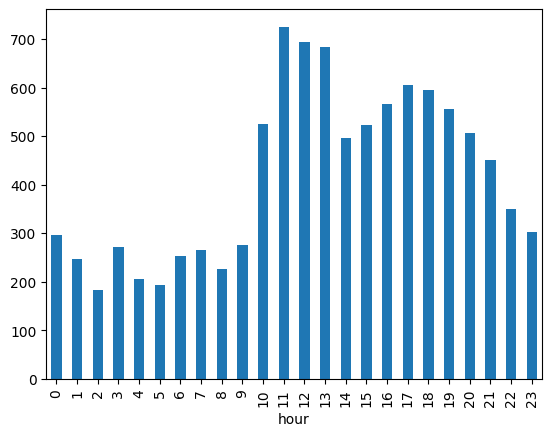

In [64]:
data.hour.value_counts().sort_index().plot.bar()

which street has the most traffic during the rush hour

In [66]:
xdata = data[data.hour ==9]
xdata.head()

,TRIP_ID,CALL_TYPE,TIMESTAMP,TRIP_PATH,START_LOC,END_LOC,week_day,hour
293,1372656656620000280,OTHER,1372656656,"[(41.164119, -8.676972), (41.16483, -8.677854)...","(41.164119, -8.676972)","(41.161032, -8.648604)",Monday,9
299,1372657008620000280,OTHER,1372657008,"[(41.161023, -8.64864), (41.161023, -8.648649)...","(41.161023, -8.64864)","(41.164974, -8.628201)",Monday,9
303,1372657150620000534,OTHER,1372657150,"[(41.183469, -8.602713), (41.182731, -8.599968...","(41.183469, -8.602713)","(41.150043, -8.613774)",Monday,9
307,1372658129620000397,OTHER,1372658129,"[(41.144634, -8.606484)]","(41.144634, -8.606484)","(41.144634, -8.606484)",Monday,9
320,1372657775620000578,CENTRAL_BASED,1372657775,"[(41.159628, -8.601777), (41.159637, -8.601777...","(41.159628, -8.601777)","(41.150439, -8.608851)",Monday,9


In [76]:
xmap=folium.Map(location = [41.15,-8.62] , zoom_start = 14)
for coords in xdata.TRIP_PATH:
    folium.PolyLine(coords, color = "red" , opacity = 0.05 , weight = 2).add_to(xmap)
xmap